In [1]:
import cv2
import numpy as np
import plotly.graph_objects as go
from PIL import Image
from sgbm_multi_scan import visualize_disparity

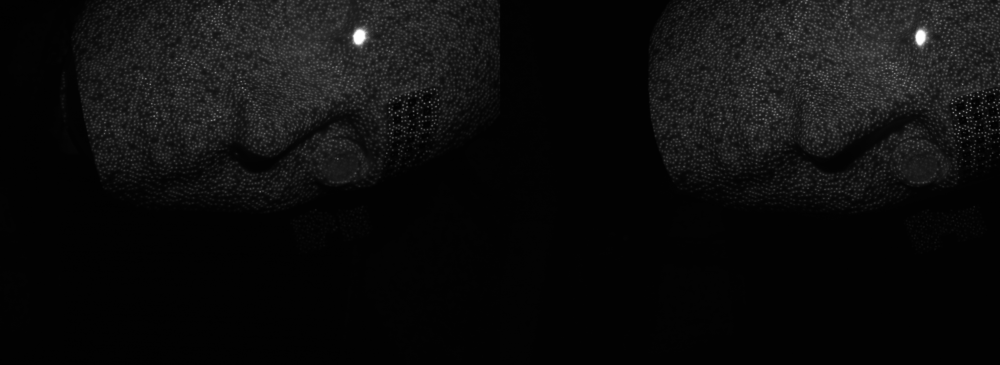

In [8]:
path = 'C:\\Github\\FSR_DLNR\\face_laser_projector\\no_markers-09_11\\'
number = '00000'
path1 = path + number + '_left.jpg'
path2 = path + number + '_right.jpg'

# Read as grayscale
img1 = cv2.imread(path1, cv2.IMREAD_GRAYSCALE)
img2 = cv2.imread(path2, cv2.IMREAD_GRAYSCALE)

# Convert from OpenCV (NumPy arrays) to PIL images
img1_pil = Image.fromarray(img1)
img2_pil = Image.fromarray(img2)

# combine 
w, h = img1_pil.size
combined = Image.new('L', (2 * w, h)) 
combined.paste(img1_pil, (0, 0))
combined.paste(img2_pil, (w, 0))
display(combined)

In [9]:
h, w = img1.shape
scale = 720 / min(h, w)
new_w, new_h = int(w * scale), int(h * scale)
img1_resize = cv2.resize(img1, (new_w, new_h), interpolation=cv2.INTER_AREA)
img2_resize = cv2.resize(img2, (new_w, new_h), interpolation=cv2.INTER_AREA)

clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
img1_resize = clahe.apply(img1_resize)
img2_resize = clahe.apply(img2_resize)

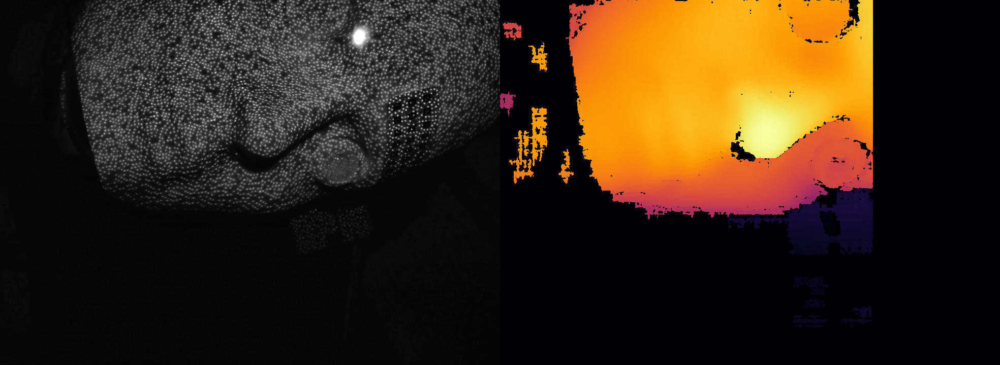

In [33]:
block_size = 5
min_disp   = -250
max_disp   = -50
num_disp = max_disp - min_disp
block_factor = 1

stereo = cv2.StereoSGBM.create(
    minDisparity      = min_disp,
    numDisparities    = num_disp,
    blockSize         = block_size,
    P1                = int(8 * block_factor * block_size**2),
    P2                = int(32 * block_factor * block_size**2),
    disp12MaxDiff     = 0,
    uniquenessRatio   = 8,
    speckleWindowSize = 500,
    speckleRange      = 2,
    mode              = 3,
)

# compute disparity and depth map
disparity = stereo.compute(img1_resize, img2_resize).astype(np.float32) / 16.0

# mask valid values
valid_mask = disparity > min_disp
disp_valid_only = np.where(valid_mask, disparity, np.nan)

# normalize ignoring NaNs
min_valid = np.nanmin(disp_valid_only)
max_valid = np.nanmax(disp_valid_only)
disp_norm = (disp_valid_only - min_valid) / (max_valid - min_valid)
disp_norm = np.nan_to_num(disp_norm, nan=0)
disp_uint8 = (disp_norm * 255).astype(np.uint8)

# display
combined_viz, _ = visualize_disparity(disp_uint8, img1_resize, show=False)
display(combined_viz)

In [11]:
q = np.load("face_laser_projector/disp_to_depth_mat.npy")
assert q.shape == (4,4)
points_3d = cv2.reprojectImageTo3D(disparity , q, handleMissingValues=True) # disparity scale??

In [12]:
points = points_3d[valid_mask]

if img1_resize.ndim == 3 and img1_resize.shape[2] == 3:
    # color image → use RGB colors
    colors = img1_resize[valid_mask][:, ::-1] / 255.0  # BGR→RGB
else:
    # grayscale image → use brightness as color
    gray = img1_resize if img1_resize.ndim == 2 else cv2.cvtColor(img1_resize, cv2.COLOR_BGR2GRAY)
    colors = np.repeat(gray[valid_mask, np.newaxis], 3, axis=1) / 255.0

x, y, z = points[:, 0], points[:, 1], -points[:, 2]  # flip Z if needed for orientation

# --- Center and enforce equal scaling ---
cx, cy, cz = np.mean(x), np.mean(y), np.mean(z)
r = max(np.ptp(x), np.ptp(y), np.ptp(z)) / 2  # half of the largest span

x_range = [cx - r, cx + r]
y_range = [cy - r, cy + r]
z_range = [cz - r, cz + r]

# --- Create 3D Scatter plot ---
fig = go.Figure(
    data=[go.Scatter3d(
        x=x, y=y, z=z,
        mode='markers',
        marker=dict(
            size=2,
            color=colors,
            opacity=0.9
        )
    )]
)

fig.update_layout(
    scene=dict(
        xaxis=dict(range=x_range, title="X", showbackground=True, backgroundcolor="rgb(240,240,240)"),
        yaxis=dict(range=y_range, title="Y", showbackground=True, backgroundcolor="rgb(240,240,240)"),
        zaxis=dict(range=z_range, title="Z", showbackground=True, backgroundcolor="rgb(240,240,240)"),
        aspectmode='cube'  # <-- this ensures equal scaling across all axes
    ),
    margin=dict(l=0, r=0, t=0, b=0),
    height=800
)

# --- Show plot ---
fig.show(renderer="browser")  # or just fig.show() in a notebook